<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#import" data-toc-modified-id="import-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>import</a></span></li><li><span><a href="#Main-part" data-toc-modified-id="Main-part-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Main part</a></span><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Dataset" data-toc-modified-id="Dataset-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Dataset</a></span></li><li><span><a href="#Visualize-the-data" data-toc-modified-id="Visualize-the-data-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Visualize the data</a></span></li><li><span><a href="#Time-Series-Forecasting-with-Prophet" data-toc-modified-id="Time-Series-Forecasting-with-Prophet-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Time Series Forecasting with Prophet</a></span><ul class="toc-item"><li><span><a href="#my_target_value-VS-my_real_value:" data-toc-modified-id="my_target_value-VS-my_real_value:-2.4.1"><span class="toc-item-num">2.4.1&nbsp;&nbsp;</span>my_target_value VS my_real_value:</a></span></li></ul></li><li><span><a href="#Script" data-toc-modified-id="Script-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Script</a></span><ul class="toc-item"><li><span><a href="#Ideas" data-toc-modified-id="Ideas-2.5.1"><span class="toc-item-num">2.5.1&nbsp;&nbsp;</span>Ideas</a></span></li></ul></li><li><span><a href="#Настройка-модели-и-рычаги" data-toc-modified-id="Настройка-модели-и-рычаги-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Настройка модели и рычаги</a></span></li></ul></li><li><span><a href="#Черновик" data-toc-modified-id="Черновик-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Черновик</a></span><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Prophet" data-toc-modified-id="Prophet-3.0.1"><span class="toc-item-num">3.0.1&nbsp;&nbsp;</span>Prophet</a></span></li></ul></li><li><span><a href="#ДРУГИМ-СПОСОБОМ" data-toc-modified-id="ДРУГИМ-СПОСОБОМ-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>ДРУГИМ СПОСОБОМ</a></span></li><li><span><a href="#begin" data-toc-modified-id="begin-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>begin</a></span></li></ul></li><li><span><a href="#neuralprophet" data-toc-modified-id="neuralprophet-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>neuralprophet</a></span></li></ul></div>

# import

In [1]:
# import pygwalker as pyg
# gwalker = pyg.walk(df)

In [2]:
import sys
import pandas as pd
import numpy as np
import scipy as sp
from scipy import stats as st
from scipy.stats import ttest_ind
from scipy.stats import mannwhitneyu
from statsmodels.stats.proportion import proportion_confint
import statsmodels.stats.api as sms
import statsmodels

from tqdm.notebook import tqdm as tqdm_notebook
from tqdm.notebook import trange
from collections import namedtuple

import matplotlib.pyplot as plt
import seaborn as sns

import datetime as dt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import openpyxl
import warnings
warnings.simplefilter("ignore")
import jaydebeapi

pd.set_option('display.max_rows', 100)

In [1]:

def connect(request_str):
    connect_function_script

# Main part

## Setup

In [3]:
#pip install prophet

In [4]:
from prophet import Prophet
from prophet.plot import plot_plotly
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
import itertools
import numpy as np
import pandas as pd
import plotly.offline as py
py.init_notebook_mode()

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

## Dataset

In [59]:
#df_first = pd.read_csv('Sessions.csv').T
#df_first = df_first.reset_index().rename(columns = {'index':'ds',0:'y'})[1:-1]

df_first = pd.read_csv('Game sessions_Summary.csv', sep = ';')
df_first = df_first.reset_index().rename(columns = {'Day of created_date':'ds','dau':'y'})[1:-1]

# Преобразование столбца 'dates' в datetime
df_first['ds'] = convert_series_to_datetime(df_first['ds'])

df = df_first[:-1].copy()

In [60]:
df_first

# index	ds	game mode	Avg. game sessions	y
# 1	1	2023-02-11	ho	14,846363592	266623
# 2	2	2023-02-12	ho	15,712126441	272380
# 3	3	2023-02-13	ho	20,851936915	274741

,index,ds,game mode,Avg. game sessions,y
1,1,2023-02-11,ho,"14,846363592",266623
2,2,2023-02-12,ho,"15,712126441",272380
3,3,2023-02-13,ho,"20,851936915",274741
4,4,2023-02-14,ho,"21,755137516",274987
5,5,2023-02-15,ho,"21,352782336",276638
6,6,2023-02-16,ho,"21,337728378",276296
7,7,2023-02-17,ho,"19,202593146",273953
8,8,2023-02-18,ho,"19,523585822",267576
9,9,2023-02-19,ho,"20,283190935",272710
10,10,2023-02-20,ho,"22,192150984",276850


In [61]:
df_second = df.copy()
df_answer = df_first[-2:-1].copy()
df_answer

,index,ds,game mode,Avg. game sessions,y
58,58,2023-04-09,ho,"16,300556883",268638


In [62]:
df[-5:]

,index,ds,game mode,Avg. game sessions,y
54,54,2023-04-05,ho,"23,416251553",284059
55,55,2023-04-06,ho,"23,147100399",280849
56,56,2023-04-07,ho,"17,243512773",277661
57,57,2023-04-08,ho,"19,658500191",267394
58,58,2023-04-09,ho,"16,300556883",268638


## Visualize the data

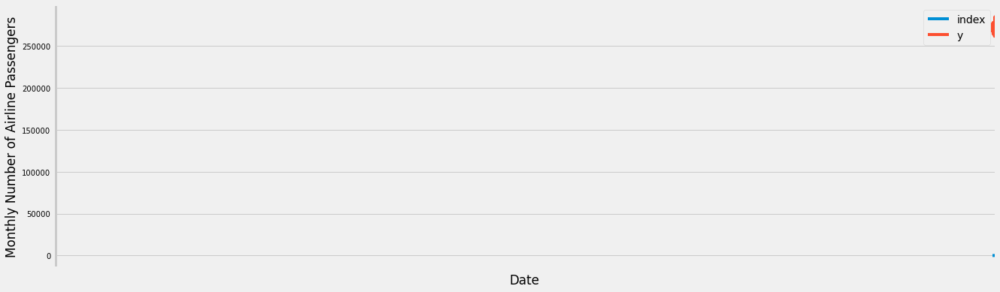

In [63]:
ax = df_first.set_index('ds').plot(figsize=(20, 6), xticks = df.index, rot = 90,fontsize = 10)
ax.set_ylabel('Monthly Number of Airline Passengers')
ax.set_xlabel('Date')
plt.savefig('real_data.png')
plt.show()

## Time Series Forecasting with Prophet

In [52]:
#pip install dateparser

In [53]:
import pandas as pd
import dateparser

def date_string_to_datetime(date_string: str) -> pd.Timestamp:
    date = dateparser.parse(date_string)
    return pd.Timestamp(date)

def convert_series_to_datetime(series: pd.Series) -> pd.Series:
    return series.apply(date_string_to_datetime)

# Создание примера DataFrame с датами в виде строк
data = {
    'dates': ["11 февраля 2023 г.", "12 марта 2023 г.", "13 апреля 2023 г."]
}

df = pd.DataFrame(data)

# Преобразование столбца 'dates' в datetime
df['dates'] = convert_series_to_datetime(df['dates'])

print(df)

       dates
0 2023-02-11
1 2023-03-12
2 2023-04-13


In [54]:
df

,dates
0,2023-02-11
1,2023-03-12
2,2023-04-13


In [64]:
my_model = Prophet(
    growth='linear', #  String 'linear', 'logistic' or 'flat' to specify a linear, logistic or flat trend.
#     changepoints=None,
#     n_changepoints=25,
#     changepoint_range=0.8,
#     yearly_seasonality='auto',
#     weekly_seasonality='auto',
#     daily_seasonality='auto',
#     holidays=None, # необходимо указать праздники
#     seasonality_mode='additive',
#     seasonality_prior_scale=10.0,
#     holidays_prior_scale=10.0,
#     changepoint_prior_scale=0.05,
#     mcmc_samples=0,
    interval_width=0.95#, #set the uncertainty interval (interval_width) to 95% (the Prophet default is 80%)
#     uncertainty_samples=1000,
#     stan_backend=None
)

In [65]:
my_model.add_seasonality(
name = 'name',
period= 28,
fourier_order = 2)


In [66]:
df

,index,ds,game mode,Avg. game sessions,y
1,1,2023-02-11,ho,"14,846363592",266623
2,2,2023-02-12,ho,"15,712126441",272380
3,3,2023-02-13,ho,"20,851936915",274741
4,4,2023-02-14,ho,"21,755137516",274987
5,5,2023-02-15,ho,"21,352782336",276638
6,6,2023-02-16,ho,"21,337728378",276296
7,7,2023-02-17,ho,"19,202593146",273953
8,8,2023-02-18,ho,"19,523585822",267576
9,9,2023-02-19,ho,"20,283190935",272710
10,10,2023-02-20,ho,"22,192150984",276850


In [67]:
my_model.fit(df)

14:52:16 - cmdstanpy - INFO - Chain [1] start processing
14:52:17 - cmdstanpy - INFO - Chain [1] done processing


In [68]:
future_dates = my_model.make_future_dataframe(periods=1, freq='D')
future_dates.head()

,ds
0,2023-02-11
1,2023-02-12
2,2023-02-13
3,2023-02-14
4,2023-02-15


In [69]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-5:]


# ds	yhat	yhat_lower	yhat_upper
# 54	2023-04-06	281906.461531	276692.980921	287167.906527
# 55	2023-04-07	278401.827305	273151.115876	283692.870639
# 56	2023-04-08	270572.353629	265153.690190	275985.215154

,ds,yhat,yhat_lower,yhat_upper
54,2023-04-06,281906.461531,276692.980921,287167.906527
55,2023-04-07,278401.827305,273151.115876,283692.870639
56,2023-04-08,270572.353629,265153.690190,275985.215154
57,2023-04-09,274437.618286,268934.282798,280397.046656
58,2023-04-10,276214.405521,270831.019800,282103.041023


In [89]:
df_answer

,index,ds,game mode,Avg. game sessions,y
58,58,2023-04-09,ho,"16,300556883",268638


In [78]:
# df_answer.reset_index()[0]

In [71]:
df_first[:2]

,index,ds,game mode,Avg. game sessions,y
1,1,2023-02-11,ho,"14,846363592",266623
2,2,2023-02-12,ho,"15,712126441",272380


### my_target_value VS my_real_value:

In [91]:
forecast[-2:]
forecast_2 = forecast.copy()
my_target_value = forecast_2['yhat'][len(forecast_2)-1]
print('my_target_value: ',my_target_value)
forecast_2['yhat'][len(forecast_2)-1] = df_answer['y'][58]

my_real_value = df_answer['y'][58]
print('my_real_value: ',my_real_value)

if (my_real_value<forecast['yhat_lower'][len(forecast)-1]):
    print('ОШИБКА: слишком маленькое значение')
elif (my_real_value>forecast['yhat_upper'][len(forecast)-1]):
    print('ОШИБКА: слишком большое значение')
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-1:]   

my_target_value:  276214.40552052227
my_real_value:  268638
ОШИБКА: слишком маленькое значение


,ds,yhat,yhat_lower,yhat_upper
58,2023-04-10,276214.405521,270831.0198,282103.041023


In [73]:
forecast['yhat_lower'][len(forecast)-1]

270831.01979976904

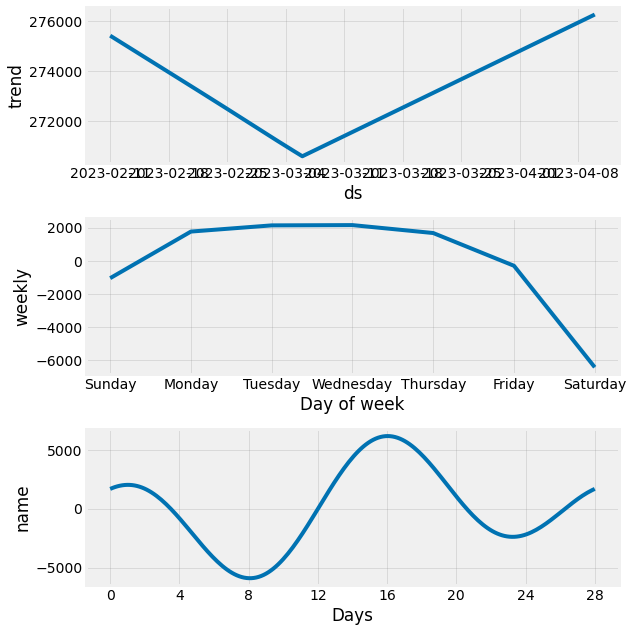

In [74]:
fig10 = my_model.plot_components(forecast)

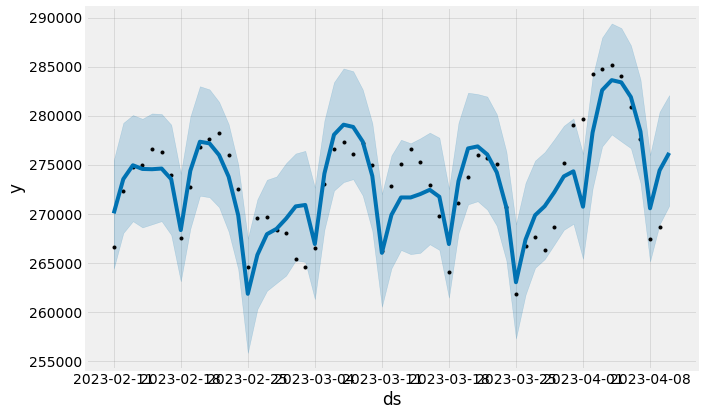

In [75]:
fig2 = my_model.plot(forecast, uncertainty=True)

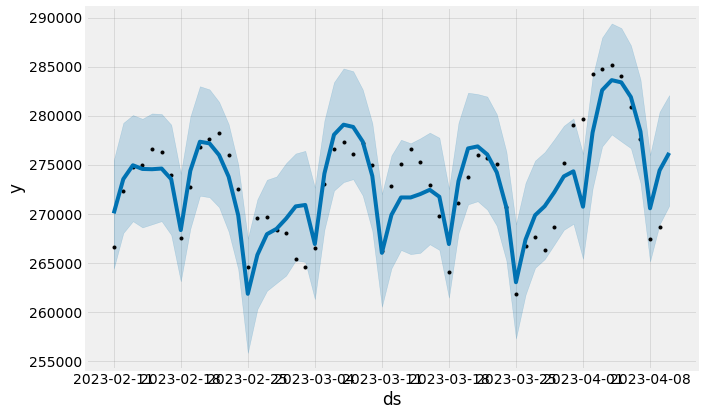

In [76]:
fig2 = my_model.plot(forecast, uncertainty=True)

In [ ]:
fig = make_subplots(rows=4, cols=1)
fig.add_trace(go.Scatter(x= df_main[(df_main.dt >= date)]['dt'], 
                         y= df_main[(df_main.dt >= date)]['revenue'],  
                         name='revenue'), 2, 1)

fig.update_layout(legend_orientation="h",
                  legend=dict(x=.5, xanchor="center"),
                  hovermode="x",
                  margin=dict(l=0, r=0, t=0, b=0),width=1000,
    height=700)
fig.update_traces(hoverinfo="all", hovertemplate="%{x}<br>%{y}")
fig.show()

## Script

In [111]:
# DAU
df_first = connect('''
select count(distinct user_id) as y,to_date(`timestamp`) as ds
from sn_ios.login
where `timestamp`>'2021-01-03' and `timestamp`<='2023-01-03'
group by to_date(`timestamp`) 
order by to_date(`timestamp`)
''')

time:  34  seconds
(730, 2)


In [10]:
# revenue
df_first = connect('''
select sum(price) as y, to_date(`timestamp`) as ds
from sn_ios.iap
where `timestamp`>'2021-01-03' and `timestamp`<='2023-01-03' and verified = true
group by to_date(`timestamp`) 
order by to_date(`timestamp`)
''')

time:  4  seconds
(730, 2)


In [131]:
df_zapas = df_first.copy()

In [132]:
#df_first = df_zapas.copy()

In [133]:
df_first[-3:]

,y,ds
727,98344.128465,2022-12-31
728,91431.598639,2023-01-01
729,95418.688744,2023-01-02


In [26]:
alfa = 0.99

from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
# Event Segmentation - [Amplitude] Revenue (2022.11.21 - 2023.02.19).csv
# Sessions.csv
#df_first = pd.read_csv('Event Segmentation - [Amplitude] Revenue (2022.11.21 - 2023.02.19).csv')
df_zapas = df_first.copy()
#df_first = df_first.T.reset_index().rename(columns = {'index':'ds',0:'y'})[1:-1]

df = df_first[:-1].copy()# набор для обучения
# [:-1] -> -1 т.к. забираем вчерашний день, его будем прогнозировать и он в обучающей выборке не нужен

df_answer = df_first[-1:].copy() # создаем таблицу с реальным значением на день, который прогнозируем

# # фактические значения показателя
# ax = df_first.set_index('ds').plot(figsize=(20, 2), xticks = df.index, rot = 90,fontsize = 10)
# ax.set_ylabel('Monthly Number of Airline Passengers')
# ax.set_xlabel('Date')
# # сохраняем наш график с фактическими значениями показателя
# plt.savefig('real_data.png')
# #plt.show()

# настройка параметров модели
my_model = Prophet(
    growth='linear', #  String 'linear', 'logistic' or 'flat' to specify a linear, logistic or flat trend.
#     changepoints=None,
#     n_changepoints=25,
#     changepoint_range=0.8,
     yearly_seasonality='auto',
     weekly_seasonality='auto',
#     daily_seasonality='auto',
#     holidays=None, # необходимо указать праздники
#     seasonality_mode='additive',
#     seasonality_prior_scale=28,
#     holidays_prior_scale=10.0,
#     changepoint_prior_scale=0.05,
#     mcmc_samples=0,
#     uncertainty_samples=1000,
#     stan_backend=None,
    interval_width=alfa #set the uncertainty interval (interval_width) to 95% (the Prophet default is 80%)
)

# добавляем сезонность обновления
my_model.add_seasonality(
    name = 'update',
    period= 28,
    fourier_order = 10)

my_model.fit(df)

future_dates = my_model.make_future_dataframe(periods=1, freq='D')
future_dates.head()

forecast = my_model.predict(future_dates)

forecast_2 = forecast.copy()
my_target_value = forecast_2['yhat'][len(forecast)-1]
my_target_value_lower = forecast_2['yhat_lower'][len(forecast)-1]
my_target_value_upper = forecast_2['yhat_upper'][len(forecast)-1]
print('my_target_value_lower: ',my_target_value_lower)
print('my_target_value: ',my_target_value)
print('my_target_value_upper: ',my_target_value_upper)
forecast_2['yhat'][len(forecast_2)-1] = df_answer['y'][len(df_first)-1]

my_real_value = df_answer['y'][len(df_first)-1]
print('my_real_value: ',my_real_value)

if (my_real_value<forecast['yhat_lower'][len(forecast)-1]):
    print('ОШИБКА: слишком маленькое значение')
elif (my_real_value>forecast['yhat_upper'][len(forecast)-1]):
    print('ОШИБКА: слишком большое значение')
else:
    print('Все ОК')

#print('Последнее значение реальное на картинке ниже')
fig_forecast_2 = my_model.plot(forecast_2, uncertainty=True,figsize=(50, 5),
                               xlabel='Последнее значение - реальное')

#print('Последнее значение предсказанное на картинке ниже')
fig2_forecast = my_model.plot(forecast, uncertainty=True,figsize=(50, 5),
                              xlabel='Последнее значение - предсказанное')


# фактические значения показателя
ax = df_first.set_index('ds').plot(figsize=(200, 5), xticks = df.index, rot = 90,fontsize = 10)
ax.set_ylabel('Monthly Number of Airline Passengers')
ax.set_xlabel('Date')
# сохраняем наш график с фактическими значениями показателя
plt.savefig('real_data.png')
#plt.show()

ValueError: Given date string not likely a datetime.

In [169]:
import itertools
import numpy as np
import pandas as pd

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

In [170]:
all_params

[{'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.01},
 {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 0.1},
 {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 1.0},
 {'changepoint_prior_scale': 0.001, 'seasonality_prior_scale': 10.0},
 {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.01},
 {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1},
 {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0},
 {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10.0},
 {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01},
 {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.1},
 {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0},
 {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0},
 {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.01},
 {'changepoint_prior_scale': 0.5, 'seasonality_prior_scale': 0.1},
 {'changepoint_prior_scale': 0.5, 'seasonal

In [12]:
%%time
# script for cross validation
param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'changepoint_range' : [0.8,0.9,0.99],
    'growth' : ['linear'],
    'yearly_seasonality' : ['auto'],
    'weekly_seasonality' : ['auto'],
    'interval_width' : [0.90,0.95,0.99]
}


all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []

for params in all_params:
    my_model = Prophet(**params)
    my_model.add_seasonality(
        name = 'update',
        period= 28,
        fourier_order = 10)
    my_model.fit(df)  # Fit model with given params
    df_cv = cross_validation(my_model, period='28 days', horizon = '1 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

16:50:30 - cmdstanpy - INFO - Chain [1] start processing
16:50:30 - cmdstanpy - INFO - Chain [1] done processing
16:50:38 - cmdstanpy - INFO - Chain [1] start processing
16:50:38 - cmdstanpy - INFO - Chain [1] done processing
16:50:47 - cmdstanpy - INFO - Chain [1] start processing
16:50:47 - cmdstanpy - INFO - Chain [1] done processing
16:50:56 - cmdstanpy - INFO - Chain [1] start processing
16:50:56 - cmdstanpy - INFO - Chain [1] done processing
16:51:05 - cmdstanpy - INFO - Chain [1] start processing
16:51:05 - cmdstanpy - INFO - Chain [1] done processing
16:51:14 - cmdstanpy - INFO - Chain [1] start processing
16:51:14 - cmdstanpy - INFO - Chain [1] done processing
16:51:23 - cmdstanpy - INFO - Chain [1] start processing
16:51:23 - cmdstanpy - INFO - Chain [1] done processing
16:51:32 - cmdstanpy - INFO - Chain [1] start processing
16:51:33 - cmdstanpy - INFO - Chain [1] done processing
16:51:43 - cmdstanpy - INFO - Chain [1] start processing
16:51:43 - cmdstanpy - INFO - Chain [1]

17:02:05 - cmdstanpy - INFO - Chain [1] done processing
17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:14 - cmdstanpy - INFO - Chain [1] done processing
17:02:23 - cmdstanpy - INFO - Chain [1] start processing
17:02:24 - cmdstanpy - INFO - Chain [1] done processing
17:02:33 - cmdstanpy - INFO - Chain [1] start processing
17:02:33 - cmdstanpy - INFO - Chain [1] done processing
17:02:42 - cmdstanpy - INFO - Chain [1] start processing
17:02:43 - cmdstanpy - INFO - Chain [1] done processing
17:02:52 - cmdstanpy - INFO - Chain [1] start processing
17:02:52 - cmdstanpy - INFO - Chain [1] done processing
17:03:01 - cmdstanpy - INFO - Chain [1] start processing
17:03:01 - cmdstanpy - INFO - Chain [1] done processing
17:03:10 - cmdstanpy - INFO - Chain [1] start processing
17:03:11 - cmdstanpy - INFO - Chain [1] done processing
17:03:22 - cmdstanpy - INFO - Chain [1] start processing
17:03:23 - cmdstanpy - INFO - Chain [1] done processing
17:03:33 - cmdstanpy - INFO - Chain [1] 

     changepoint_prior_scale  seasonality_prior_scale  changepoint_range  \
0                      0.001                     0.01               0.80   
1                      0.001                     0.01               0.80   
2                      0.001                     0.01               0.80   
3                      0.001                     0.01               0.90   
4                      0.001                     0.01               0.90   
..                       ...                      ...                ...   
139                    0.500                    10.00               0.90   
140                    0.500                    10.00               0.90   
141                    0.500                    10.00               0.99   
142                    0.500                    10.00               0.99   
143                    0.500                    10.00               0.99   

     growth yearly_seasonality weekly_seasonality  interval_width  \
0    linear       

In [17]:
tuning_results.sort_values(by = 'rmse')

,changepoint_prior_scale,seasonality_prior_scale,changepoint_range,growth,yearly_seasonality,weekly_seasonality,interval_width,rmse
104,0.100,10.0,0.90,linear,auto,auto,0.99,5033.490896
103,0.100,10.0,0.90,linear,auto,auto,0.95,5033.490896
102,0.100,10.0,0.90,linear,auto,auto,0.90,5033.490896
98,0.100,1.0,0.99,linear,auto,auto,0.99,5051.252622
97,0.100,1.0,0.99,linear,auto,auto,0.95,5051.252622
...,...,...,...,...,...,...,...,...
14,0.001,0.1,0.90,linear,auto,auto,0.99,11138.061887
12,0.001,0.1,0.90,linear,auto,auto,0.90,11138.061887
25,0.001,1.0,0.99,linear,auto,auto,0.95,11151.915886
26,0.001,1.0,0.99,linear,auto,auto,0.99,11151.915886


In [156]:
df_answer

,y,ds
729,95418.688744,2023-01-02


In [157]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,update,update_lower,update_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-01-03,138114.388986,102204.675439,173829.223638,138114.388986,138114.388986,2157.447020,2157.447020,2157.447020,-1660.321775,-1660.321775,-1660.321775,3817.768795,3817.768795,3817.768795,0.0,0.0,0.0,140271.836006
1,2021-01-04,137940.168342,97322.690416,170101.769258,137940.168342,137940.168342,-3728.241084,-3728.241084,-3728.241084,-2539.792502,-2539.792502,-2539.792502,-1188.448582,-1188.448582,-1188.448582,0.0,0.0,0.0,134211.927258
2,2021-01-05,137765.947698,89415.622430,168191.073548,137765.947698,137765.947698,-9553.474123,-9553.474123,-9553.474123,-1854.480114,-1854.480114,-1854.480114,-7698.994009,-7698.994009,-7698.994009,0.0,0.0,0.0,128212.473574
3,2021-01-06,137591.727054,94786.190222,174986.698312,137591.727054,137591.727054,-1986.234454,-1986.234454,-1986.234454,119.679198,119.679198,119.679198,-2105.913652,-2105.913652,-2105.913652,0.0,0.0,0.0,135605.492599
4,2021-01-07,137417.506410,92914.654470,177248.754737,137417.506410,137417.506410,-2400.536745,-2400.536745,-2400.536745,2675.683232,2675.683232,2675.683232,-5076.219977,-5076.219977,-5076.219977,0.0,0.0,0.0,135016.969665
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,2022-12-29,87984.211419,53634.882439,126958.717903,87984.211419,87984.211419,1086.369958,1086.369958,1086.369958,6162.589934,6162.589934,6162.589934,-5076.219977,-5076.219977,-5076.219977,0.0,0.0,0.0,89070.581376
726,2022-12-30,87940.292059,57519.256711,127957.221995,87940.292059,87940.292059,8277.516470,8277.516470,8277.516470,3434.931479,3434.931479,3434.931479,4842.584991,4842.584991,4842.584991,0.0,0.0,0.0,96217.808529
727,2022-12-31,87896.372700,59478.243880,132119.937295,87896.372700,87896.372700,7957.592741,7957.592741,7957.592741,548.370307,548.370307,548.370307,7409.222434,7409.222434,7409.222434,0.0,0.0,0.0,95853.965441
728,2023-01-01,87852.453341,54715.908112,131034.267765,87852.453341,87852.453341,2157.447020,2157.447020,2157.447020,-1660.321775,-1660.321775,-1660.321775,3817.768795,3817.768795,3817.768795,0.0,0.0,0.0,90009.900361


### Ideas
Добавить в праздничные дни наши неудачные дни и крайне удачные, дни с хотфиксами или дни перед ними

In [164]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(my_model, #initial='730 days',
                        period='28 days', horizon = '1 days')

  0%|          | 0/25 [00:00<?, ?it/s]

16:25:34 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing
16:25:35 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing
16:25:35 - cmdstanpy - INFO - Chain [1] start processing
16:25:36 - cmdstanpy - INFO - Chain [1] done processing
16:25:36 - cmdstanpy - INFO - Chain [1] start processing
16:25:36 - cmdstanpy - INFO - Chain [1] done processing
16:25:36 - cmdstanpy - INFO - Chain [1] start processing
16:25:36 - cmdstanpy - INFO - Chain [1] done processing
16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing
16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing
16:25:37 - cmdstanpy - INFO - Chain [1] start processing
16:25:38 - cmdstanpy - INFO - Chain [1] done processing
16:25:38 - cmdstanpy - INFO - Chain [1] start processing
16:25:38 - cmdstanpy - INFO - Chain [1]

In [165]:
abs(df_cv['y'] - df_cv['yhat']).mean()

5119.432491385571

In [167]:
import itertools
import numpy as np
import pandas as pd

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

16:28:38 - cmdstanpy - INFO - Chain [1] start processing
16:28:38 - cmdstanpy - INFO - Chain [1] done processing


NameError: name 'performance_metrics' is not defined

In [ ]:
my_model.cross_validation(
horizon = ,
units = ,
period = 'D',
initial = NULL,
cutoffs = NULL
)


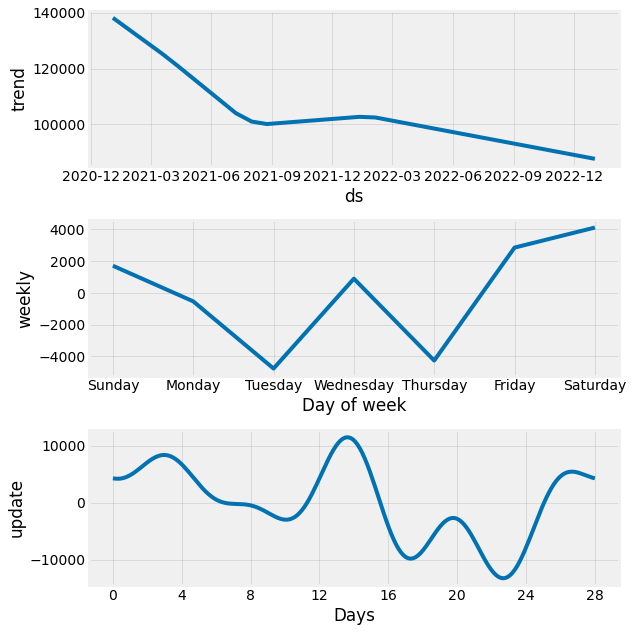

In [141]:
ff = my_model.plot_components(forecast)

## Настройка модели и рычаги
- date interval (size data)


- interval_width (alfa) = 0.95


- fourier_order - я так понимаю отвечает за переобучаемость и подгонку результата, надо найти как оптимизировать


- holidays # можем указывать необычные дни, чтобы не влиять аномальными значениями на обучение модели

Последнее значение реальное на картинке ниже


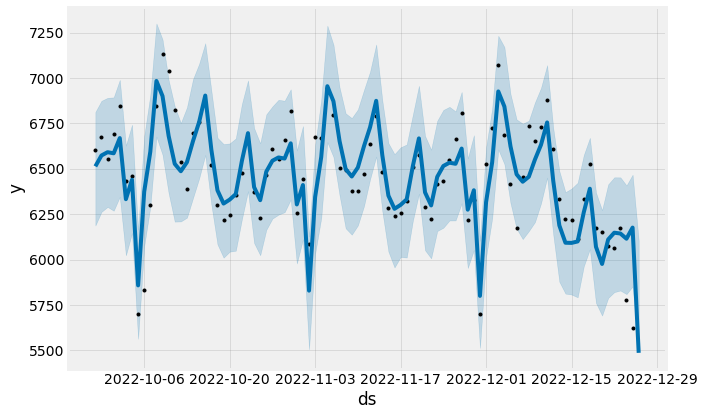

In [227]:
## при 28 fourier_order
print('Последнее значение реальное на картинке ниже')
fig_forecast_2 = my_model.plot(forecast_2, uncertainty=True)

Последнее значение реальное на картинке ниже


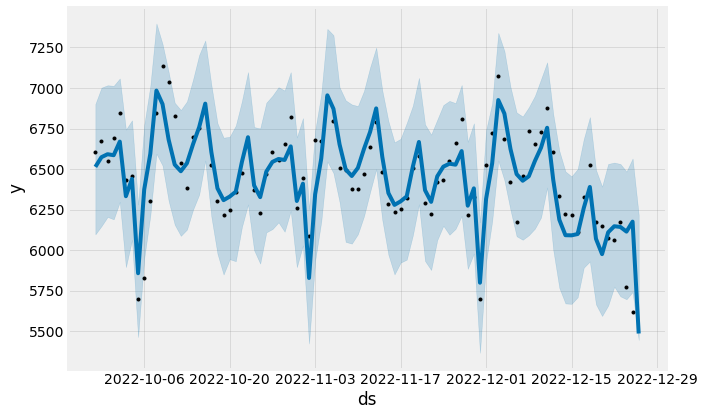

In [183]:
## при 99 fourier_order
print('Последнее значение реальное на картинке ниже')
fig_forecast_2 = my_model.plot(forecast_2, uncertainty=True)

# Черновик

Без добавления сезонности 28 days

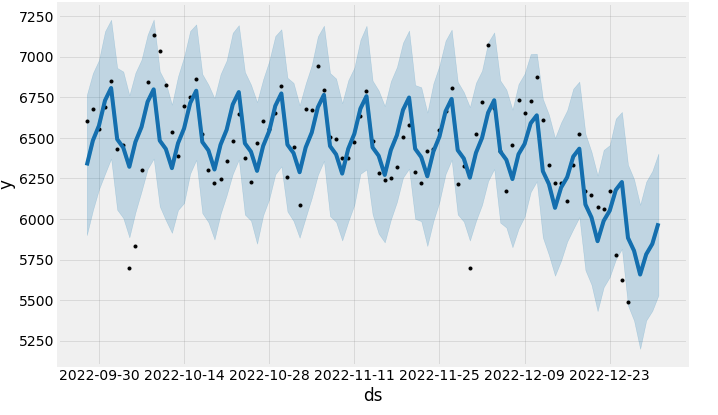

С добавлением сезонности 28 days

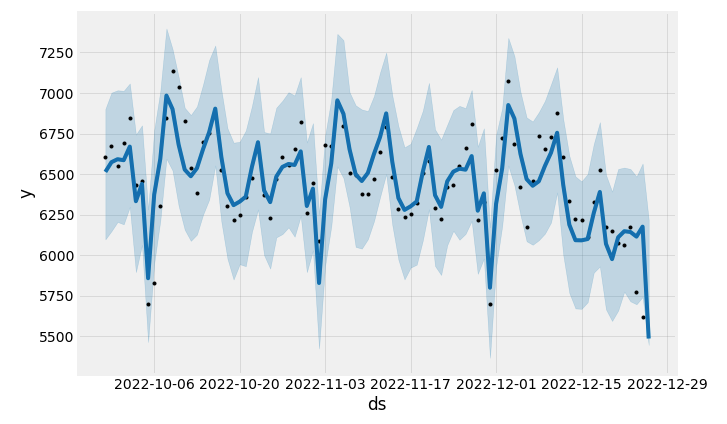

### Prophet

In [3]:
import pandas as pd

In [79]:
df = pd.read_csv('Sessions.csv')

In [80]:
df = df.T.reset_index()

In [81]:
df = df.rename(columns = {df.columns[0]:'ds',df.columns[1]:'y'})[1:-1]

In [82]:
df

,ds,y
1,2022-09-28,6605.18535
2,2022-09-29,6675.947471
3,2022-09-30,6552.34829
4,2022-10-01,6688.666749
5,2022-10-02,6848.113455
...,...,...
86,2022-12-22,6064.783639
87,2022-12-23,6175.293128
88,2022-12-24,5775.234809
89,2022-12-25,5621.032962


<AxesSubplot:>

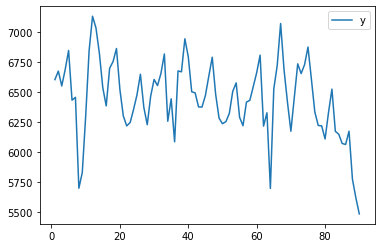

In [83]:
df.plot()

In [84]:
#pip install prophet

In [85]:
from prophet import Prophet

In [30]:
m = Prophet(
    growth='linear',
    changepoints=None,
    n_changepoints=25,
    changepoint_range=0.8,
    yearly_seasonality='auto',
    weekly_seasonality='auto',
    daily_seasonality='auto',
    holidays=None, # необходимо указать праздники
    seasonality_mode='additive',
    seasonality_prior_scale=10.0,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.05,
    mcmc_samples=0,
    interval_width=0.8,
    uncertainty_samples=1000,
    stan_backend=None
)
m.fit(df)

15:22:23 - cmdstanpy - INFO - Chain [1] start processing
15:22:23 - cmdstanpy - INFO - Chain [1] done processing


In [87]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
450,2023-12-22
451,2023-12-23
452,2023-12-24
453,2023-12-25
454,2023-12-26


In [88]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
450,2023-12-22,-4641.442706,-8831.918677,-467.105325
451,2023-12-23,-4514.027730,-8656.337130,-341.542558
452,2023-12-24,-4465.442068,-8603.499318,-258.558343
453,2023-12-25,-4809.431025,-9035.222869,-527.159886
454,2023-12-26,-4889.167292,-9083.971381,-753.244175


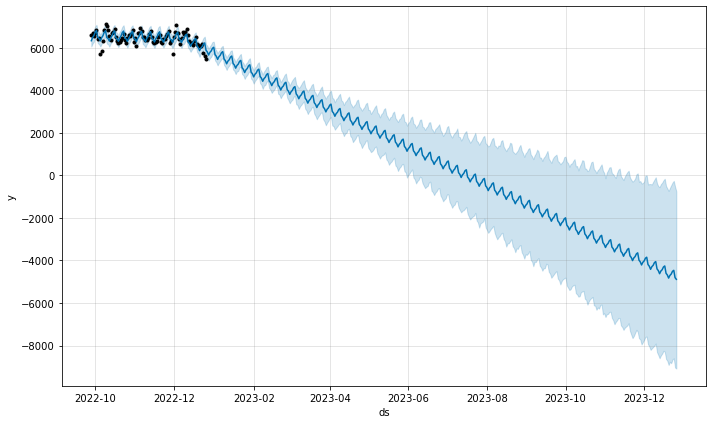

In [89]:
fig1 = m.plot(forecast)

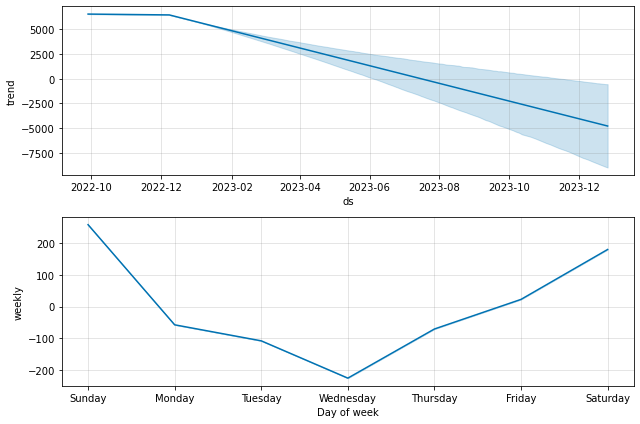

In [90]:
fig2 = m.plot_components(forecast)

## ДРУГИМ СПОСОБОМ
https://machinelearningmastery.ru/decompose-time-series-data-trend-seasonality/

In [105]:
df = df.set_index('ds')

In [113]:
from statsmodels.tsa.seasonal import seasonal_decompose
series = df['y']
result = seasonal_decompose(series, model='additive', period = 7)
# print(result.trend)
# print(result.seasonal)
# print(result.resid)
# print(result.observed)


# fig = matplotlib.pyplot.gcf()
# fig.set_size_inches(18.5, 10.5)

In [124]:
df.index

Index(['2022-09-28', '2022-09-29', '2022-09-30', '2022-10-01', '2022-10-02',
       '2022-10-03', '2022-10-04', '2022-10-05', '2022-10-06', '2022-10-07',
       '2022-10-08', '2022-10-09', '2022-10-10', '2022-10-11', '2022-10-12',
       '2022-10-13', '2022-10-14', '2022-10-15', '2022-10-16', '2022-10-17',
       '2022-10-18', '2022-10-19', '2022-10-20', '2022-10-21', '2022-10-22',
       '2022-10-23', '2022-10-24', '2022-10-25', '2022-10-26', '2022-10-27',
       '2022-10-28', '2022-10-29', '2022-10-30', '2022-10-31', '2022-11-01',
       '2022-11-02', '2022-11-03', '2022-11-04', '2022-11-05', '2022-11-06',
       '2022-11-07', '2022-11-08', '2022-11-09', '2022-11-10', '2022-11-11',
       '2022-11-12', '2022-11-13', '2022-11-14', '2022-11-15', '2022-11-16',
       '2022-11-17', '2022-11-18', '2022-11-19', '2022-11-20', '2022-11-21',
       '2022-11-22', '2022-11-23', '2022-11-24', '2022-11-25', '2022-11-26',
       '2022-11-27', '2022-11-28', '2022-11-29', '2022-11-30', '2022-12-01',

C:\Users\new pc\AppData\Local\Temp\ipykernel_22460\1563179052.py:3: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


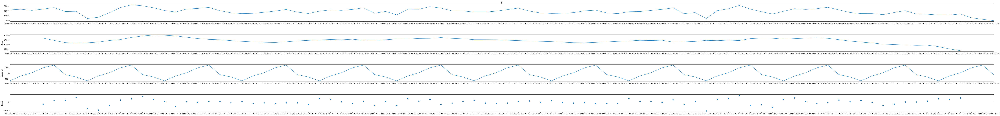

In [134]:
fig = result.plot()
fig.set_size_inches(100.5, 10.5)
fig.show()

In [96]:
from random import randrange
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = df['y']
result = seasonal_decompose(series, model='additive')
result.plot()
pyplot.show()

ValueError: You must specify a period or x must be a pandas object with a PeriodIndex or a DatetimeIndex with a freq not set to None

In [98]:
type(df['y'])

pandas.core.series.Series

## begin

In [9]:
# Python
import pandas as pd
from prophet import Prophet

In [24]:
df = pd.read_csv('Sessions.csv').T
df = df.reset_index().rename(columns = {'index':'ds',0:'y'})[1:]

In [52]:
df.iloc[10]['y'] = 12000.00001

In [42]:
df.shape

(91, 2)

In [43]:
m = Prophet()
m.fit(df)

18:56:34 - cmdstanpy - INFO - Chain [1] start processing
18:56:34 - cmdstanpy - INFO - Chain [1] done processing


In [44]:
# Python
future = m.make_future_dataframe(periods=7)
future.tail()

,ds
93,2022-12-30
94,2022-12-31
95,2023-01-01
96,2023-01-02
97,2023-01-03


In [45]:
# Python
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
93,2022-12-30,5920.318930,4930.433409,6825.146809
94,2022-12-31,6463.676453,5565.564140,7450.015842
95,2023-01-01,6135.554913,5189.001090,7084.264888
96,2023-01-02,5811.395763,4878.262835,6724.363691
97,2023-01-03,5408.308686,4462.749678,6361.387992


In [50]:
forecast[:3]

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-09-28,6898.320006,5748.756983,7549.241785,6898.320006,6898.320006,-242.617356,-242.617356,-242.617356,-242.617356,-242.617356,-242.617356,0.0,0.0,0.0,6655.702650
1,2022-09-29,6888.631179,5865.297812,7772.790034,6888.631179,6888.631179,-83.307720,-83.307720,-83.307720,-83.307720,-83.307720,-83.307720,0.0,0.0,0.0,6805.323459
2,2022-09-30,6878.942352,5935.316335,7814.984518,6878.942352,6878.942352,12.518047,12.518047,12.518047,12.518047,12.518047,12.518047,0.0,0.0,0.0,6891.460399


In [58]:
df.shape

(91, 2)

In [60]:
forecast.shape

(98, 16)

In [59]:
df['y'] > forecast['yhat_upper'][:91]

ValueError: Can only compare identically-labeled Series objects

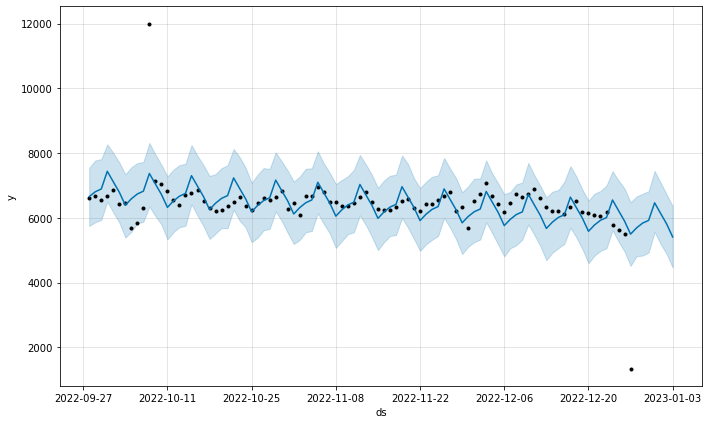

In [46]:
# Python
fig1 = m.plot(forecast)


In [2]:
pip install fbprophet

^C
Note: you may need to restart the kernel to use updated packages.


In [4]:
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

ModuleNotFoundError: No module named 'fbprophet'

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [ ]:
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [6]:
df = pd.read_csv('Sessions.csv')

In [8]:
df.T

,0
Segment,user_level ≥ 100
2022-09-28,6605.18535
2022-09-29,6675.947471
2022-09-30,6552.34829
2022-10-01,6688.666749
...,...
2022-12-23,6175.293128
2022-12-24,5775.234809
2022-12-25,5621.032962
2022-12-26,5486.515394


# neuralprophet

In [18]:
pip install neuralprophet

Note: you may need to restart the kernel to use updated packages.Collecting neuralprophet

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for plotly-resampler: filename=plotly_resampler-0.8.3.1-cp39-cp39-win_amd64.whl size=69446 sha256=4c70ae0e8d77f9acfdbf0e639757d0e02be7c4313b8c017ee31959aabc272806
  Stored in directory: c:\users\new pc\appdata\local\pip\cache\wheels\4a\92\b3\8072de06c318440d59d31163610e1f765584074ab61c777edd
Successfully built plotly-resampler
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.1
    Uninstalling protobuf-3.19.1:
      Successfully uninstalled protobuf-3.19.1
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.42.0
    Uninsta

In [19]:
df[:3]

,y,ds
0,147432.877087,2021-01-03
1,117459.048020,2021-01-04
2,136207.968863,2021-01-05


In [21]:
forecast

,ds,y,yhat1,trend,season_weekly
0,2021-01-03,147432.877087,132690.078125,129432.890625,3257.180176
1,2021-01-04,117459.048020,129811.656250,129462.117188,349.544800
2,2021-01-05,136207.968863,123039.484375,129491.343750,-6451.859375
3,2021-01-06,117110.278870,128175.984375,129520.562500,-1344.585083
4,2021-01-07,109956.108629,124864.890625,129549.796875,-4684.906250
...,...,...,...,...,...
724,2022-12-28,104657.238341,88712.578125,90057.164062,-1344.585083
725,2022-12-29,97827.258387,85355.156250,90040.062500,-4684.906250
726,2022-12-30,99809.158255,92479.484375,90022.968750,2456.515869
727,2022-12-31,98344.128465,96423.976562,90005.867188,6418.109863


WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 16
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 215
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (46) is too small than the required number for the learning rate finder (222). The re

Finding best initial lr:   0%|          | 0/222 [00:00<?, ?it/s]

Missing logger folder: C:\Users\new pc\work\разделение на тренд временного ряда\lightning_logs


Training: 0it [00:00, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting: 46it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


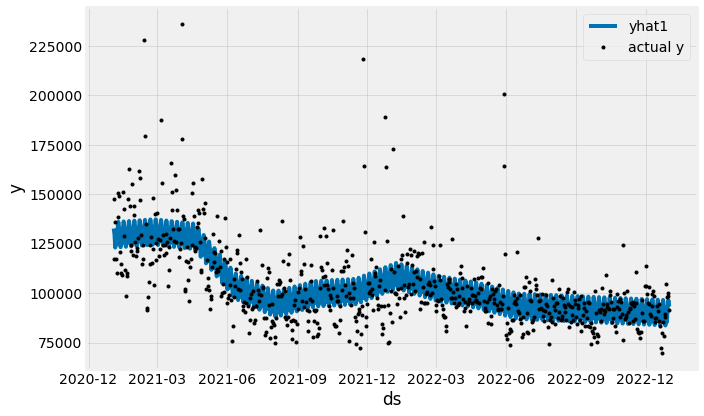

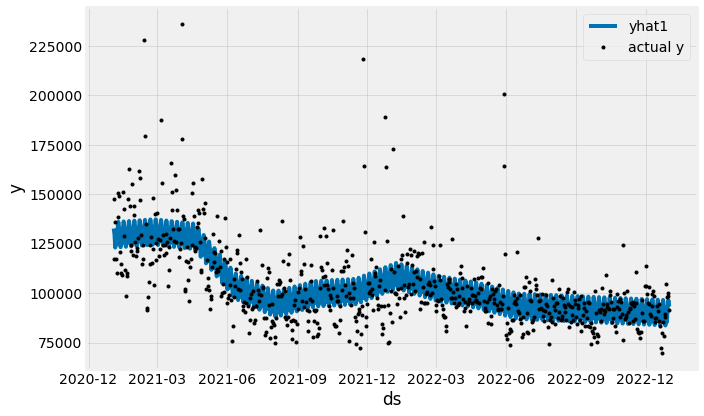

In [20]:
from neuralprophet import NeuralProphet
m = NeuralProphet()
metrics = m.fit(df, freq='D')
forecast = m.predict(df)
m.plot(forecast)

In [22]:
m = NeuralProphet(
    n_changepoints=100,
    trend_reg=24,
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
metrics = m.fit(df)
forecast = m.predict(df)

INFO - (NP.config.__post_init__) - Note: Trend changepoint regularization is experimental.
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Dataframe freq automatically defined as D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 16
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 215
WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (46) is too small than the required number for the learning rate finder (222). The results might not be optimal.


Finding best initial lr:   0%|          | 0/222 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D


Predicting: 46it [00:00, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


WARNING - (NP.plotting.log_warning_deprecation_plotly) - DeprecationWarning: default plotting_backend will be changed to plotly in a future version. Switch to plotly by calling `m.set_plotting_backend('plotly')`.


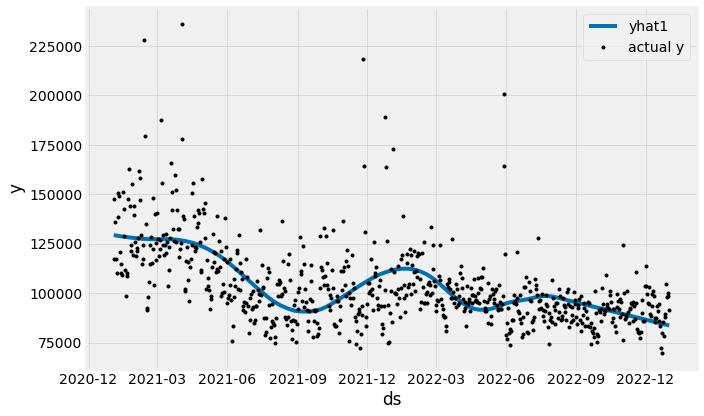

In [23]:
a = m.plot(forecast)

In [ ]:
m = NeuralProphet()
metrics = m.fit(df)

In [ ]:
m = NeuralProphet(
    seasonality_mode='multiplicative'
)

In [ ]:
m = NeuralProphet(
    yearly_seasonality=16,
    weekly_seasonality=8,
    daily_seasonality=False,
    seasonality_reg=1,
)

In [2]:
import sys
import pandas as pd
import numpy as np
from datetime import datetime
import warnings

import jaydebeapi
from prophet import Prophet
import plotly.offline as py

warnings.simplefilter("ignore")
pd.set_option('display.max_rows', 100)

def connect(request_str):
    start_time = datetime.now()
    connection = jaydebeapi.connect("com.cloudera.impala.jdbc.Driver",
                          "jdbc:impala://impala-prod.mytonagames.com:21050",
                          {'UID': 'vladimir_kovardakov_t618f', 'PWD': ''},
                          'C:\Program Files (x86)\SQL_workbench\ImpalaJDBC42.jar')
    cursor = connection.cursor()
    cursor.execute(request_str)
    
    column_names = [col[0] for col in cursor.description]
    data = pd.DataFrame(cursor.fetchall(), columns=column_names)
    
    print('time: ', (datetime.now() - start_time).seconds, ' seconds')
    print(data.shape)
    return data

def convert_series_to_datetime(series):
    return pd.to_datetime(series, format='%Y-%m-%d')

def prepare_data(file_name):
    df = pd.read_csv(file_name, sep=';')
    df = df.reset_index().rename(columns={'Day of created_date': 'ds', 'dau': 'y'})[1:-1]
    df['ds'] = convert_series_to_datetime(df['ds'])
    return df

def build_forecast_model(df):
    model = Prophet(interval_width=0.95)
    model.add_seasonality(name='custom_seasonality', period=28, fourier_order=2)
    model.fit(df)
    return model

def main():
    py.init_notebook_mode()

    data = prepare_data('Game sessions_Summary.csv')
    df = data[:-1].copy()
    model = build_forecast_model(df)
    
    future_dates = model.make_future_dataframe(periods=1, freq='D')
    forecast = model.predict(future_dates)
    forecast_result = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-5:]
    
    print(forecast_result)

if __name__ == "__main__":
    main()

ValueError: time data 11 февраля 2023 г. doesn't match format specified

16:30:39 - cmdstanpy - INFO - Chain [1] start processing
16:30:39 - cmdstanpy - INFO - Chain [1] done processing


           ds           yhat     yhat_lower     yhat_upper
54 2023-04-06  281906.461531  276097.804716  287612.235895
55 2023-04-07  278401.827305  272641.615556  283564.575789
56 2023-04-08  270572.353629  265132.393995  276123.126778
57 2023-04-09  274437.618286  269162.739438  280076.468620
58 2023-04-10  276214.405521  270208.811826  281888.362755
Фактическое значение: 27214
Предсказанное значение: 276214
Величина отклонения: -249000
Доверительный интервал: 270209:281888


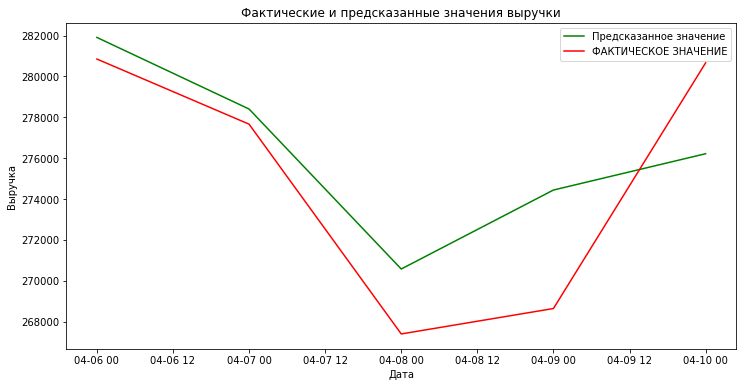

In [22]:
import sys
import pandas as pd
import numpy as np
from datetime import datetime
import warnings

import jaydebeapi
from prophet import Prophet
import plotly.offline as py

import dateparser

warnings.simplefilter("ignore")
pd.set_option('display.max_rows', 100)

def date_string_to_datetime(date_string: str) -> pd.Timestamp:
    date = dateparser.parse(date_string)
    return pd.Timestamp(date)

def convert_series_to_datetime(series: pd.Series) -> pd.Series:
    return series.apply(date_string_to_datetime)

def connect(request_str):
    start_time = datetime.now()
    connection = jaydebeapi.connect("com.cloudera.impala.jdbc.Driver",
                          "jdbc:impala://impala-prod.mytonagames.com:21050",
                          {'UID': 'vladimir_kovardakov_t618f', 'PWD': ''},
                          'C:\Program Files (x86)\SQL_workbench\ImpalaJDBC42.jar')
    cursor = connection.cursor()
    cursor.execute(request_str)
    
    column_names = [col[0] for col in cursor.description]
    data = pd.DataFrame(cursor.fetchall(), columns=column_names)
    
    print('time: ', (datetime.now() - start_time).seconds, ' seconds')
    print(data.shape)
    return data

def prepare_data(file_name):
    df = pd.read_csv(file_name, sep=';')
    df = df.reset_index().rename(columns={'Day of created_date': 'ds', 'dau': 'y'})[1:-1]
    df['ds'] = convert_series_to_datetime(df['ds'])
    return df

def build_forecast_model(df):
    model = Prophet(interval_width=0.95)
    model.add_seasonality(name='custom_seasonality', period=28, fourier_order=2)
    model.fit(df)
    return model

def main():
    py.init_notebook_mode()

    data = prepare_data('Game sessions_Summary.csv')
    df = data[:-1].copy()
    model = build_forecast_model(df)
    
    future_dates = model.make_future_dataframe(periods=1, freq='D')
    forecast = model.predict(future_dates)
    forecast_result = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-5:]
    
    print(forecast_result)
    bounds = calculate_bounds(forecast_result)
    print(bounds)
    
from prophet import Prophet

def calculate_bounds(data):
    # Подготовка данных для использования с Prophet
    df = data.rename(columns={'date': 'ds', 'revenue': 'y'})

    # Создание и обучение модели Prophet
    model = Prophet()
    model.fit(df)

    # Предсказание для следующих дней
    future = model.make_future_dataframe(periods=1) # periods=1 для предсказания только на следующий день
    forecast = model.predict(future)

    # Выделение столбцов с нижней и верхней границами
    bounds = forecast[['ds', 'yhat_lower', 'yhat_upper']].tail(1)
    
    return bounds

#bounds = calculate_bounds(forecast_result)


py.init_notebook_mode()

data = prepare_data('Game sessions_Summary.csv')
df = data[:-1].copy()
model = build_forecast_model(df)

future_dates = model.make_future_dataframe(periods=1, freq='D')
forecast = model.predict(future_dates)
forecast_result = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']][-5:]

print(forecast_result)

# Фактическое значение
fact = int(round(27214.405521))
print(f"Фактическое значение: {fact}")

# Предсказанное значение
yhat = int(round(forecast_result['yhat'].tail(1).values[0]))
print(f"Предсказанное значение: {yhat}")

# Величина отклонения
deviation = fact - yhat
print(f"Величина отклонения: {deviation}")

# Доверительный интервал
yhat_lower = int(round(forecast_result['yhat_lower'].tail(1).values[0]))
yhat_upper = int(round(forecast_result['yhat_upper'].tail(1).values[0]))
print(f"Доверительный интервал: {yhat_lower}:{yhat_upper}")


import seaborn as sns
import matplotlib.pyplot as plt
# Построение графика
plt.figure(figsize=(12, 6))
sns.lineplot(data=forecast_result, x='ds', y='yhat', label='Предсказанное значение', color='green')
fact_data = data[['ds', 'y']].tail(5)
sns.lineplot(data=fact_data, x='ds', y='y', label='ФАКТИЧЕСКОЕ ЗНАЧЕНИЕ', color='red')
plt.title('Фактические и предсказанные значения выручки')
plt.xlabel('Дата')
plt.ylabel('Выручка')
plt.legend()
plt.show()




In [19]:
forecast_result

,ds,yhat,yhat_lower,yhat_upper
54,2023-04-06,281906.461531,276689.914826,287518.555440
55,2023-04-07,278401.827305,272804.122513,284321.400439
56,2023-04-08,270572.353629,265238.495249,276133.003186
57,2023-04-09,274437.618286,268537.451344,279996.774461
58,2023-04-10,276214.405521,270773.874534,281942.848041


In [20]:
data[-5:]

,index,ds,game mode,Avg. game sessions,y
55,55,2023-04-06,ho,"23,147100399",280849
56,56,2023-04-07,ho,"17,243512773",277661
57,57,2023-04-08,ho,"19,658500191",267394
58,58,2023-04-09,ho,"16,300556883",268638
59,59,2023-04-10,ho,"22,106003328",280661


In [5]:
from prophet import Prophet

def calculate_bounds(data):
    # Подготовка данных для использования с Prophet
    df = data.rename(columns={'date': 'ds', 'revenue': 'y'})

    # Создание и обучение модели Prophet
    model = Prophet()
    model.fit(df)

    # Предсказание для следующих дней
    future = model.make_future_dataframe(periods=1) # periods=1 для предсказания только на следующий день
    forecast = model.predict(future)

    # Выделение столбцов с нижней и верхней границами
    bounds = forecast[['ds', 'yhat_lower', 'yhat_upper']].tail(1)
    
    return bounds

bounds = calculate_bounds(data)

NameError: name 'data' is not defined

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    125.23             3756.86
Prediction (s.d.)         120.35 (0.35)      3610.64 (10.47)
95% CI                    [119.7, 121.07]    [3590.91, 3631.97]

Absolute effect (s.d.)    4.87 (0.35)        146.22 (10.47)
95% CI                    [4.16, 5.53]       [124.89, 165.95]

Relative effect (s.d.)    4.05% (0.29%)      4.05% (0.29%)
95% CI                    [3.46%, 4.6%]      [3.46%, 4.6%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 125.23. By contrast, in the absence of an
intervention, we would have expected an average response of 120.35.
The 95% interval of this counterfactual prediction is [119.7, 121.07].
Subtracting this prediction from 

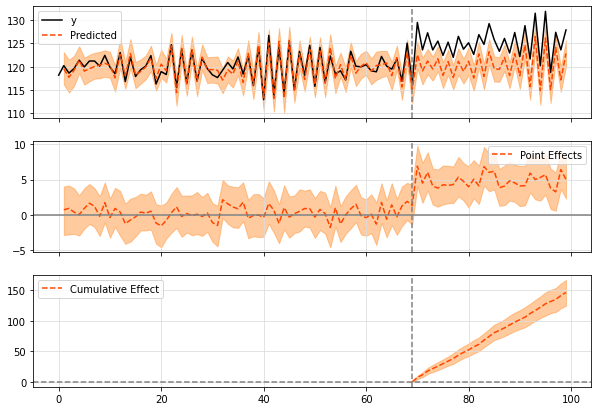

In [27]:
import numpy as np
import pandas as pd
from causalimpact import CausalImpact

# Загрузка данных и выбор нужных столбцов
data = pd.read_csv('https://raw.githubusercontent.com/WillianFuks/tfcausalimpact/master/tests/fixtures/arma_data.csv')[['y', 'X']]

# Создание синтетических данных с ковариатами (x1,...,x6)
np.random.seed(42)
num_rows = data.shape[0]
covariates = pd.DataFrame(np.random.randn(num_rows, 6), columns=[f'x{i}' for i in range(1, 7)])

# Объединение данных y, X и ковариатов
data = pd.concat([data, covariates], axis=1)

# Добавление эффекта рекламной компании к данным после 70-го периода
data.iloc[70:, 0] += 5

# Определение пред- и пост-периодов для анализа
pre_period = [0, 69]
post_period = [70, 99]

# Создание и проведение анализа Causal Impact с учетом ковариатов
ci = CausalImpact(data, pre_period, post_period)

# Вывод результатов
print(ci.summary())
print(ci.summary(output='report'))

# Построение графика результатов
ci.plot()

In [28]:
data

,y,X,x1,x2,x3,x4,x5,x6
0,118.188694,99.795292,0.496714,-0.138264,0.647689,1.523030,-0.234153,-0.234137
1,120.233276,100.663180,1.579213,0.767435,-0.469474,0.542560,-0.463418,-0.465730
2,118.627775,98.883699,0.241962,-1.913280,-1.724918,-0.562288,-1.012831,0.314247
3,119.609722,100.448941,-0.908024,-1.412304,1.465649,-0.225776,0.067528,-1.424748
4,121.391508,101.561734,-0.544383,0.110923,-1.150994,0.375698,-0.600639,-0.291694
5,119.949150,99.987845,-0.601707,1.852278,-0.013497,-1.057711,0.822545,-1.220844
6,121.220007,100.103847,0.208864,-1.959670,-1.328186,0.196861,0.738467,0.171368
7,121.206869,100.188284,-0.115648,-0.301104,-1.478522,-0.719844,-0.460639,1.057122
8,120.129993,100.599567,0.343618,-1.763040,0.324084,-0.385082,-0.676922,0.611676
9,122.429889,100.706824,1.031000,0.931280,-0.839218,-0.309212,0.331263,0.975545


Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    125.23             3756.86
Prediction (s.d.)         120.41 (0.38)      3612.32 (11.38)
95% CI                    [119.67, 121.16]   [3590.08, 3634.67]

Absolute effect (s.d.)    4.82 (0.38)        144.54 (11.38)
95% CI                    [4.07, 5.56]       [122.2, 166.79]

Relative effect (s.d.)    4.0% (0.31%)       4.0% (0.31%)
95% CI                    [3.38%, 4.62%]     [3.38%, 4.62%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 125.23. By contrast, in the absence of an
intervention, we would have expected an average response of 120.41.
The 95% interval of this counterfactual prediction is [119.67, 121.16].
Subtracting this prediction from 

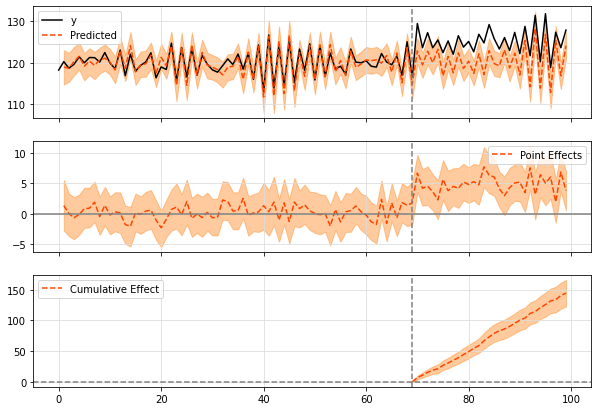

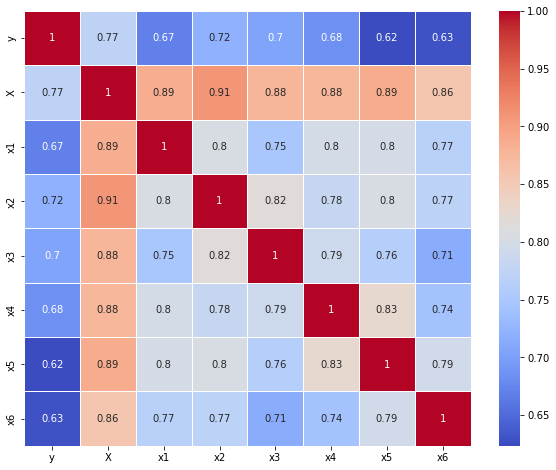

In [29]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from causalimpact import CausalImpact

# Загрузка данных и выбор нужных столбцов
data = pd.read_csv('https://raw.githubusercontent.com/WillianFuks/tfcausalimpact/master/tests/fixtures/arma_data.csv')[['y', 'X']]

# Создание синтетических данных с ковариатами (x1,...,x6) с корреляцией >60% к признаку X
np.random.seed(42)
num_rows = data.shape[0]

# Функция для генерации данных с заданной корреляцией
def generate_correlated_data(correlation, num_samples, base_col):
    samples = np.random.randn(num_samples)
    noise = np.random.randn(num_samples)
    return correlation * base_col + (1 - correlation ** 2) ** 0.5 * noise

correlated_covariates = pd.DataFrame()

for i in range(1, 7):
    correlated_covariate = generate_correlated_data(0.6, num_rows, data['X'])
    correlated_covariates[f'x{i}'] = correlated_covariate

# Объединение данных y, X и ковариатов
data = pd.concat([data, correlated_covariates], axis=1)

# Добавление эффекта рекламной компании к данным после 70-го периода
data.iloc[70:, 0] += 5

# Определение пред- и пост-периодов для анализа
pre_period = [0, 69]
post_period = [70, 99]

# Создание и проведение анализа Causal Impact с учетом ковариатов
ci = CausalImpact(data, pre_period, post_period)

# Вывод результатов
print(ci.summary())
print(ci.summary(output='report'))

# Построение графика результатов
ci.plot()

# Расчет корреляции между столбцами
correlation_matrix = data.corr()

# Визуализация матрицы корреляции
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.show()


In [30]:
data

,y,X,x1,x2,x3,x4,x5,x6
0,118.188694,99.795292,58.744879,59.213979,60.618117,59.458997,60.172114,60.675583
1,120.233276,100.663180,60.061392,59.949763,61.925441,61.237116,60.083237,58.080904
2,118.627775,98.883699,59.056048,59.928054,58.211365,58.766744,59.353215,61.000919
3,119.609722,100.448941,59.627543,60.757661,60.719740,59.142595,61.292126,60.157693
4,121.391508,101.561734,60.808012,60.920319,60.416526,59.691737,61.089920,61.823587
5,119.949150,99.987845,60.315948,60.086569,59.603007,60.477515,60.029856,59.160782
6,121.220007,100.103847,61.571257,61.084440,59.588393,59.037965,58.974423,60.552527
7,121.206869,100.188284,60.252632,59.639713,59.421778,61.516806,60.709973,59.270238
8,120.129993,100.599567,60.565781,60.797418,60.398558,58.694197,60.876128,59.860725
9,122.429889,100.706824,60.364538,60.262340,59.759334,61.781260,62.154698,61.955320


Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    125.23             3756.86
Prediction (s.d.)         120.35 (0.34)      3610.38 (10.14)
95% CI                    [119.69, 121.02]   [3590.76, 3630.49]

Absolute effect (s.d.)    4.88 (0.34)        146.49 (10.14)
95% CI                    [4.21, 5.54]       [126.38, 166.11]

Relative effect (s.d.)    4.06% (0.28%)      4.06% (0.28%)
95% CI                    [3.5%, 4.6%]       [3.5%, 4.6%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))
Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 125.23. By contrast, in the absence of an
intervention, we would have expected an average response of 120.35.
The 95% interval of this counterfactual prediction is [119.69, 121.02].
Subtracting this prediction from 

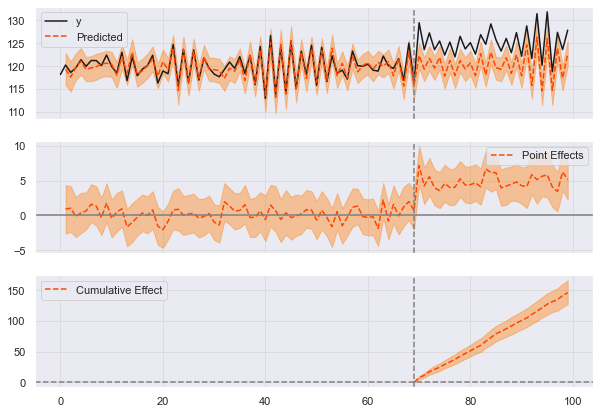

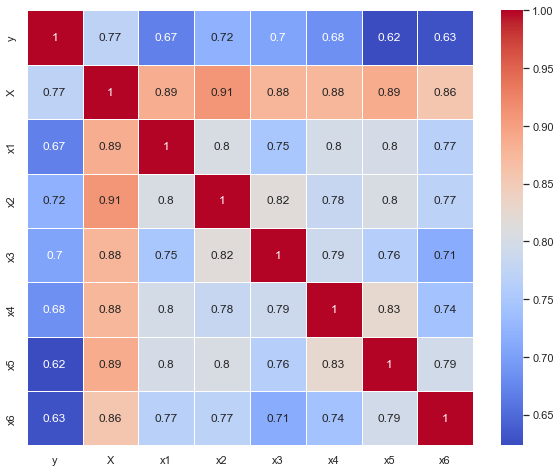

In [33]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from causalimpact import CausalImpact

# Загрузка данных и выбор нужных столбцов
data = pd.read_csv('https://raw.githubusercontent.com/WillianFuks/tfcausalimpact/master/tests/fixtures/arma_data.csv')[['y', 'X']]
data_zap = data.copy()
# Создание синтетических данных с ковариатами (x1,...,x6) с корреляцией >60% к признаку X
np.random.seed(42)
num_rows = data.shape[0]

def generate_correlated_data(correlation, num_samples, base_col):
    samples = np.random.randn(num_samples)
    noise = np.random.randn(num_samples)
    return correlation * base_col + (1 - correlation ** 2) ** 0.5 * noise

correlated_covariates = pd.DataFrame()

for i in range(1, 7):
    correlated_covariate = generate_correlated_data(0.6, num_rows, data['X'])
    correlated_covariates[f'x{i}'] = correlated_covariate

# Объединение данных y, X и ковариатов
data = pd.concat([data, correlated_covariates], axis=1)

# Добавление эффекта рекламной компании к данным после 70-го периода
data.iloc[70:, 0] += 5

# Определение пред- и пост-периодов для анализа
pre_period = [0, 69]
post_period = [70, 99]

# Создание и проведение анализа Causal Impact с использованием ковариатов (x1,...,x6)
ci = CausalImpact(data, pre_period, post_period, model_args={'niter': 2000})

# Вывод результатов
print(ci.summary())
print(ci.summary(output='report'))

# Построение графика результатов
ci.plot()

# Расчет корреляции между столбцами
correlation_matrix = data.corr()

# Визуализация матрицы корреляции
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.show()


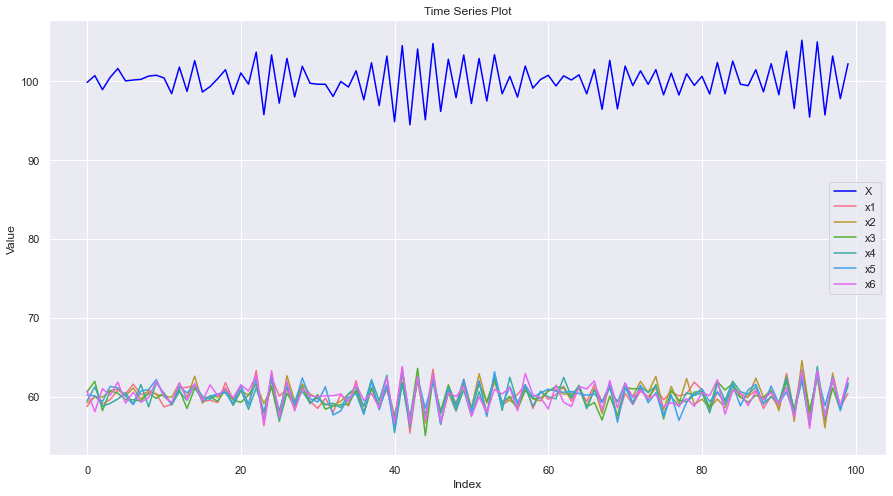

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_time_series(df):
    plt.figure(figsize=(15, 8))
    sns.set(style="darkgrid")
    
    # Визуализация столбца X с синим цветом
    sns.lineplot(data=df, x=df.index, y='X', label='X', color='blue')

    # Визуализация столбцов x1...x6 с разными цветами
    colors = sns.color_palette("husl", len(df.columns) - 2)
    for i, color in zip(range(1, 7), colors):
        sns.lineplot(data=df, x=df.index, y=f'x{i}', label=f'x{i}', color=color)

    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title('Time Series Plot')
    plt.legend()
    plt.show()

# Вызов функции для визуализации временных рядов
plot_time_series(data)


In [36]:
import plotly.graph_objects as go

def plot_time_series_plotly(df):
    fig = go.Figure()

    # Визуализация столбца X с синим цветом
    fig.add_trace(go.Scatter(x=df.index, y=df['X'], mode='lines', name='X', line=dict(color='blue')))

    # Визуализация столбцов x1...x6 с разными цветами
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    for i, color in zip(range(1, 7), colors):
        fig.add_trace(go.Scatter(x=df.index, y=df[f'x{i}'], mode='lines', name=f'x{i}', line=dict(color=color)))

    fig.update_layout(title='Time Series Plot', xaxis_title='Index', yaxis_title='Value')
    fig.show()

# Вызов функции для визуализации временных рядов
plot_time_series_plotly(data)

In [35]:
data

,y,X,x1,x2,x3,x4,x5,x6
0,118.188694,99.795292,58.744879,59.213979,60.618117,59.458997,60.172114,60.675583
1,120.233276,100.663180,60.061392,59.949763,61.925441,61.237116,60.083237,58.080904
2,118.627775,98.883699,59.056048,59.928054,58.211365,58.766744,59.353215,61.000919
3,119.609722,100.448941,59.627543,60.757661,60.719740,59.142595,61.292126,60.157693
4,121.391508,101.561734,60.808012,60.920319,60.416526,59.691737,61.089920,61.823587
5,119.949150,99.987845,60.315948,60.086569,59.603007,60.477515,60.029856,59.160782
6,121.220007,100.103847,61.571257,61.084440,59.588393,59.037965,58.974423,60.552527
7,121.206869,100.188284,60.252632,59.639713,59.421778,61.516806,60.709973,59.270238
8,120.129993,100.599567,60.565781,60.797418,60.398558,58.694197,60.876128,59.860725
9,122.429889,100.706824,60.364538,60.262340,59.759334,61.781260,62.154698,61.955320
